In [31]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn import init
import torch.fx
import math
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d as conv2
from tqdm import tqdm
import pickle
from rwa import *

# Initialisation

In [2]:
# define the network
class Network(nn.Module):
    def __init__(self, non_rgb_state_size, num_actions, hidden_size, init_weight_normal, visual_only=False):
        super(Network, self).__init__()
        # Define a flag
        self.visual_only = visual_only
        # Define the conv network
        self.conv1 = nn.Conv2d(3, 16, 8, stride=4, padding=1)
        self.conv2 = nn.Conv2d(16, 32, 5, stride=2)
        if self.visual_only:
            self.fc1 = nn.Linear(1152, hidden_size)
        else:
            self.fc1 = nn.Linear(1152 + non_rgb_state_size, hidden_size)
        self.lstm = nn.LSTMCell(hidden_size, hidden_size)
        # define the network to output the policy
        self.fc_actor1 = nn.Linear(hidden_size, num_actions)
        self.fc_actor2 = nn.Linear(hidden_size, num_actions)
        self.fc_actor3 = nn.Linear(hidden_size, num_actions)
        self.fc_actor4 = nn.Linear(hidden_size, num_actions)
        self.fc_actor5 = nn.Linear(hidden_size, num_actions)
        self.fc_actor6 = nn.Linear(hidden_size, num_actions)
        # define the network to output the value
        self.critic_value = nn.Linear(hidden_size, 1)
        # orthogonal weight initialisation
        for name, p in self.named_parameters():
            if 'weight' in name:
                if init_weight_normal:
                    fan_in, _ = init._calculate_fan_in_and_fan_out(p)
                    std = 1 / math.sqrt(fan_in)
                    init.normal_(p, std=std)
                else:
                    init.orthogonal_(p)
            elif 'bias' in name:
                init.constant_(p, 0)
    
    # define the forward function
    def forward(self, non_rgb_state, rgb_state, h, masks, nenv=None):
        x1 = self.conv1(rgb_state / 255.0)
        x = F.relu(x1)
        x2 = self.conv2(x)
        x = F.relu(x2)
        x = x.view(x.size(0), -1)
        if self.visual_only:
            x = self.fc1(x)
        else:
            x = self.fc1(torch.cat((x, non_rgb_state), 1))
        if nenv is None:
            hx, cx = h
            hx = hx * masks
            cx = cx * masks
            h = self.lstm(x, (hx, cx))
            x = h[0]
        else:
            hxs, cxs = h
            envstartidx = np.arange(0, rgb_state.size(0), rgb_state.size(0) / nenv)
            x = x.view(-1, 1, x.size(1))
            masks = masks.view(-1, 1, masks.size(1))
            outputs = []
            for idx in range(rgb_state.size(0)):
                if idx in envstartidx:
                    hx = hxs[idx].unsqueeze(0)
                    cx = cxs[idx].unsqueeze(0)
                hx = hx * masks[idx]
                cx = cx * masks[idx]
                hx, cx = self.lstm(x[idx], (hx, cx))
                outputs.append(hx)
            x = torch.cat(outputs, 0)
            
        # get the alpha and beta for the beta distribution; the policy is *stochastic*
        policy1 = F.softmax(self.fc_actor1(x), dim=1).clamp(max=1 - 1e-20)
        policy2 = F.softmax(self.fc_actor2(x), dim=1).clamp(max=1 - 1e-20)
        policy3 = F.softmax(self.fc_actor3(x), dim=1).clamp(max=1 - 1e-20)
        policy4 = F.softmax(self.fc_actor4(x), dim=1).clamp(max=1 - 1e-20)
        policy5 = F.softmax(self.fc_actor5(x), dim=1).clamp(max=1 - 1e-20)
        policy6 = F.softmax(self.fc_actor6(x), dim=1).clamp(max=1 - 1e-20) 
        pi = (policy1, policy2, policy3, policy4, policy5, policy6)
        # get the state value
        value = self.critic_value(x)

        return x1, x2, h 

In [34]:
# visual only - no proprioception; agent learns a policy based on visual input only
net = Network(num_actions=5, non_rgb_state_size=0, hidden_size=128, init_weight_normal=1, visual_only=True)

# load trained model
modelfilename = './WeightData/JacoFetch/all-models/jaco/visual_random/seed_5/model.pt'
net.load_state_dict(torch.load(modelfilename, map_location=torch.device('cpu')))

<All keys matched successfully>

# Weight Visualisation

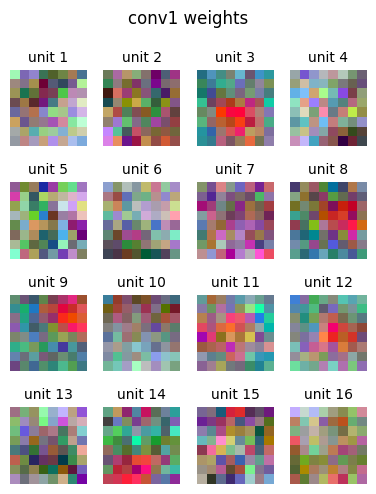

In [4]:
# conv1 weights (kernels) visualisation - 16 units
w1 = net.state_dict()['conv1.weight']
w1 = np.transpose(w1, (0, 2, 3, 1)) # transform to visualisation format in rgb state

for i in range(w1.shape[0]): # loop through each unit
    plt.subplot(4, 4, i+1) # nrows, ncols, index
    plt.axis('off')
    to_show = (w1[i] - w1[i].min()) / (w1[i].max() - w1[i].min()) # normalise to [0, 1]
    plt.imshow(to_show) # normalise to [0, 1]
    plt.title('unit ' + str(i+1), fontsize=10)

# title for the entire plot
plt.suptitle('conv1 weights')
# increase the spacing between subplots
plt.tight_layout()
# change figure size
plt.gcf().set_size_inches(4, 5)
plt.show()

# RWA & RWC

RWA

In [32]:
# Manually set BSzie and NBatches
NBatches = 100
BSize = 500

In [35]:
act_conv1, noise1 = ActRecorder('conv1', net, NBatches=NBatches, BSize=BSize, zeroMean=True)

100%|██████████| 16/16 [00:00<00:00, 398.67it/s]


Shape of activation response list: torch.Size([16, 50000])
Shape of noise list: torch.Size([50000, 64, 64, 3])


In [36]:
rf1 = RWA('conv1', net, act_conv1, noise1, NBatches=NBatches, BSize=BSize)

100%|██████████| 800000/800000 [01:20<00:00, 9990.74it/s] 

Shape of receptive field list: torch.Size([16, 64, 64, 3])


In [218]:
torch.save(act_conv1, './jaco_rand_0mean/act1.pt')
torch.save(noise1, './jaco_rand_0mean/noise1.pt')
torch.save(rf1, './jaco_rand_0mean/rf1.pt')

In [ ]:
act_conv2, noise2 = ActRecorder('conv2', NBatches=NBatches, BSize=BSize)

In [82]:
rf2 = RWA('conv2', act_conv2, noise2, NBatches=NBatches, BSize=BSize)

100%|██████████| 1600000/1600000 [15:08<00:00, 1760.88it/s]


Shape of receptive field list: torch.Size([32, 64, 64, 3])


In [84]:
torch.save(act_conv2, './jacoRF_rand/act2.pt')
torch.save(noise2, './jacoRF_rand/noise2.pt')
torch.save(rf2, './jacoRF_rand/rf2.pt')

RF & Response Visualisation

In [287]:
act_conv1 = torch.load('./jaco_rand_0mean/act1.pt')
noise1 = torch.load('./jaco_rand_0mean/noise1.pt')
rf1 = torch.load('./jaco_rand_0mean/rf1.pt')

# act_conv2 = torch.load('./jacoRF_rand/act2.pt')
# noise2 = torch.load('./jacoRF_rand/noise2.pt')
# rf2 = torch.load('./jacoRF_rand/rf2.pt')

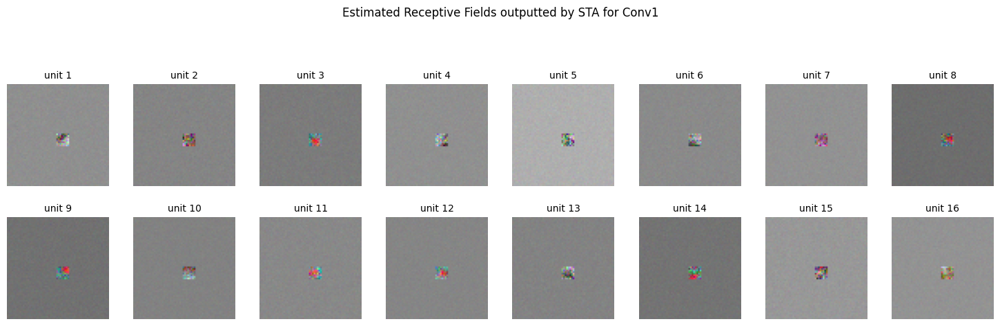

In [37]:
# conv1 RF
for i in range(rf1.shape[0]): # loop through each unit
    plt.subplot(2, 8, i+1) # nrows, ncols, index
    plt.axis('off')
    to_show = rf1[i]
    if to_show.any() != 0:
        to_show = (to_show - to_show.min()) / (to_show.max() - to_show.min()) # normalise to [0, 1]
        plt.imshow(to_show)
    else:
        # show a black image
        plt.imshow(np.zeros((64, 64, 3)))
    plt.title('unit ' + str(i+1), fontsize=10)

# title for the entire plot
plt.suptitle('Estimated Receptive Fields outputted by STA for Conv1')
# increase the spacing between subplots
plt.tight_layout()
# change figure size
plt.gcf().set_size_inches(15, 5.5)
plt.show()

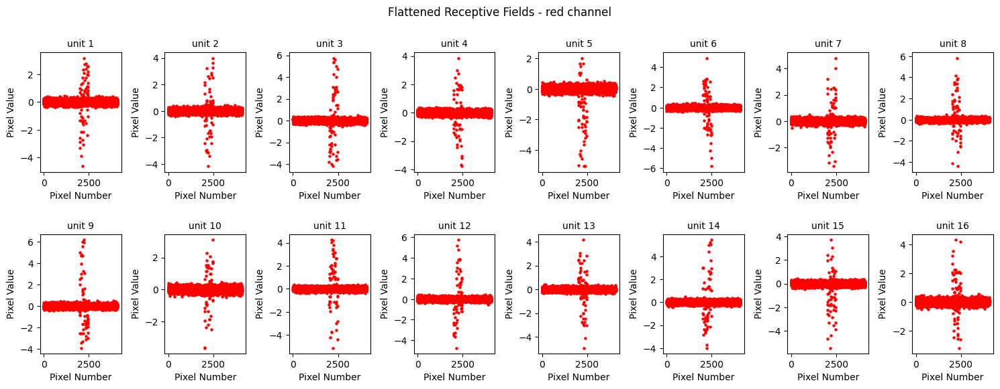

In [38]:
channel = 0
color = ['red', 'green', 'blue']

for i in range(rf1.shape[0]): # loop through each unit
    plt.subplot(2, 8, i+1) # nrows, ncols, index
    plt.xlabel('Pixel Number')
    plt.ylabel('Pixel Value')
    to_show = rf1[i,:,:,channel]
    if to_show.any() != 0:
        # flatten the receptive field into 1 x 4096
        to_show = to_show.flatten()
        plt.scatter(range(len(to_show)), to_show, s=5, c=color[channel])
        plt.gcf().set_size_inches(15, 5)
    else:
        # show a black image
        plt.imshow(np.zeros((64, 64, 3)))
    plt.title('unit ' + str(i+1), fontsize=10)

# title for the entire plot
plt.suptitle(f'Flattened Receptive Fields - {color[channel]} channel')
# increase the spacing between subplots
plt.tight_layout()
# change figure size
plt.gcf().set_size_inches(15, 6)
plt.show()

In [40]:
# conv2 RF
for i in range(rf2.shape[0]): # loop through each unit
    plt.subplot(4, 8, i+1) # nrows, ncols, index
    plt.axis('off')
    to_show = rf2[i]
    if to_show.any() != 0:
        to_show = (to_show - to_show.min())/(to_show.max() - to_show.min())
        plt.imshow(to_show) # normalise to [0, 1]
    else:
        # show a black image
        plt.imshow(np.zeros((64, 64, 3)))
    plt.title('unit ' + str(i+1), fontsize=10)

# title for the entire plot
plt.suptitle('Estimated Receptive Fields outputted by STA for Conv2')
# increase the spacing between subplots
plt.tight_layout()
# change figure size
plt.gcf().set_size_inches(15, 9)
plt.show()

NameError: name 'rf2' is not defined

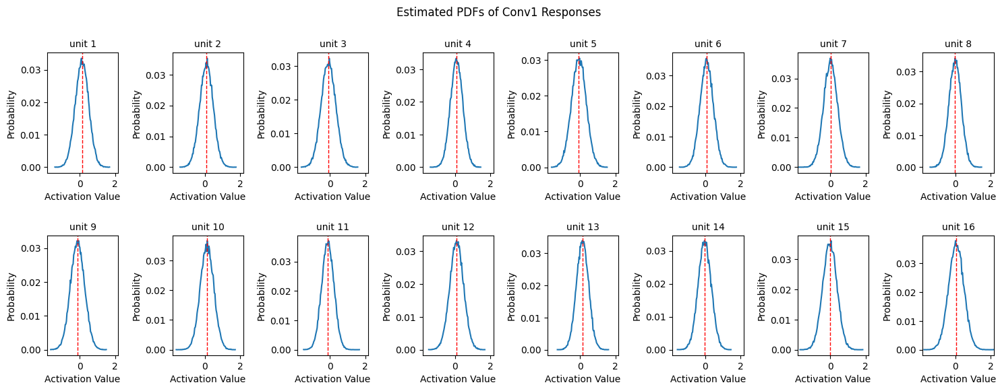

In [39]:
# PDFs of conv1 responses
for i in range(act_conv1.shape[0]):
    plt.subplot(2, 8, i+1)
    plt.xlim(act_conv1.min(), act_conv1.max())
    # temp is a list of non-zero values in act_conv1[i]
    temp = act_conv1[i][act_conv1[i] != 0]
    
    if temp.shape[0] != 0: # if temp is not empty
        counts, bin_edges = np.histogram(temp, bins=100)
        pdf = counts / sum(counts)
        bin_centers = (bin_edges[1:] + bin_edges[:-1]) / 2
        plt.plot(bin_centers, pdf)
        plt.xlabel('Activation Value')
        plt.ylabel('Probability')
        plt.axvline(act_conv1[i].mean(), color='red', linestyle='dashed', linewidth=1)
    else:
        # plot shows text saying 'inactive'
        plt.text(0.5, 0.5, 'inactive', horizontalalignment='center', verticalalignment='center')
        plt.title('unit ' + str(i+1), fontsize=10)
        plt.axis('off')
    plt.title('unit ' + str(i+1), fontsize=10)
    # change figure size
    plt.gcf().set_size_inches(14, 5)

plt.suptitle('Estimated PDFs of Conv1 Responses')
plt.tight_layout()
# change figure size
plt.gcf().set_size_inches(15, 6)
plt.show()

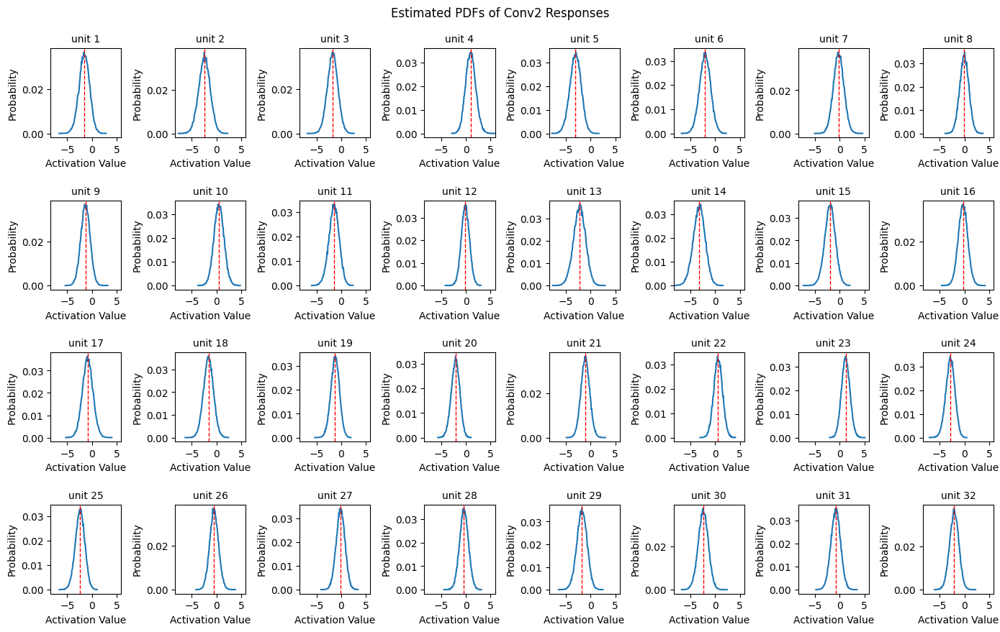

In [348]:
# PDFs of conv2 responses
for i in range(act_conv2.shape[0]):
    plt.subplot(4, 8, i+1)
    plt.xlim(act_conv2.min(), act_conv2.max())
    # temp is a list of non-zero values in act_conv1[i]
    temp = act_conv2[i][act_conv2[i] != 0]
    
    if temp.shape[0] != 0:
        # plt.xlim(0, 1.3)
        counts, bin_edges = np.histogram(temp, bins=100)
        pdf = counts / sum(counts)
        bin_centers = (bin_edges[1:] + bin_edges[:-1]) / 2
        plt.plot(bin_centers, pdf)
        plt.xlabel('Activation Value')
        plt.ylabel('Probability')
        plt.axvline(act_conv2[i].mean(), color='red', linestyle='dashed', linewidth=1)
    else:
        # plot shows text saying 'inactive'
        plt.text(0.5, 0.5, 'inactive', horizontalalignment='center', verticalalignment='center')
    plt.title('unit ' + str(i+1), fontsize=10)
    # change figure size
    plt.gcf().set_size_inches(14, 8)

plt.suptitle('Estimated PDFs of Conv2 Responses')
plt.tight_layout()
# change figure size
plt.gcf().set_size_inches(14, 9)
plt.show()

RWC

In [48]:
cov1 = RWC('conv1', act_conv1, noise1, rf1, NBatches=NBatches, BSize=BSize)

Shape of reshaped receptive field list: torch.Size([16, 4096, 3])
Shape of reshaped noise list: torch.Size([500, 4096, 3])


100%|██████████| 8000/8000 [06:10<00:00, 21.60it/s]


Shape of covariance matrix list: torch.Size([16, 4096, 4096, 3])


In [ ]:
torch.save(cov1, './jacoRF_rand2/cov1.pt')

In [ ]:
cov2 = RWC('conv2', act_conv2, noise2, rf2, NBatches=50, BSize=1000)

Shape of reshaped receptive field list: torch.Size([32, 4096, 3])
Shape of reshaped noise list: torch.Size([100000, 4096, 3])


100%|██████████| 800000/800000 [10:48:08<00:00, 20.57it/s]   


Shape of covariance matrix list: torch.Size([32, 4096, 4096, 3])


In [ ]:
torch.save(cov2, './jacoRF_rand/cov2.pt')

In [180]:
cov1 = torch.load('./jaco_rand_0mean/cov1.pt')

In [ ]:
cov2 = torch.load('./jacoRF_rand/cov2.pt')

In [44]:
def eigenAnalysis(cov, unit):
    eigen = []
    for i in range(3):
        eigen.append(torch.linalg.eigh(cov[unit, :, :, i]))
    return eigen

In [49]:
# eigen analysis - conv1
NUnits = cov1.shape[0]
eigen1 = []
with tqdm(total=NUnits) as pbar:
    for i in range(NUnits):
        eigen1.append(eigenAnalysis(cov1, i))
        pbar.update(1)

  0%|          | 0/16 [00:00<?, ?it/s]

100%|██████████| 16/16 [03:18<00:00, 12.43s/it]


In [ ]:
# save the eigenvalues and eigenvectors
with open('./jacoRF_rand/eigen1.pkl', 'wb') as f:
    pickle.dump(eigen1, f)

In [488]:
# eigen analysis - conv2
NUnits = cov2.shape[0]
eigen2 = []
with tqdm(total=NUnits) as pbar:
    for i in range(NUnits):
        eigen2.append(eigenAnalysis(cov2, i))
        pbar.update(1)

100%|██████████| 32/32 [07:01<00:00, 13.16s/it]


In [ ]:
# save the eigenvalues and eigenvectors
with open('./jacoRF_rand/eigen2.pkl', 'wb') as f:
    pickle.dump(eigen2, f)

In [342]:
# Load the list from the file
with open('./jaco_rand_0mean/eigen1.pkl', 'rb') as f:
    eigen1 = pickle.load(f)
# Load the list from the file
with open('./jaco_rand_0mean/eigen2.pkl', 'rb') as f:
    eigen2 = pickle.load(f)

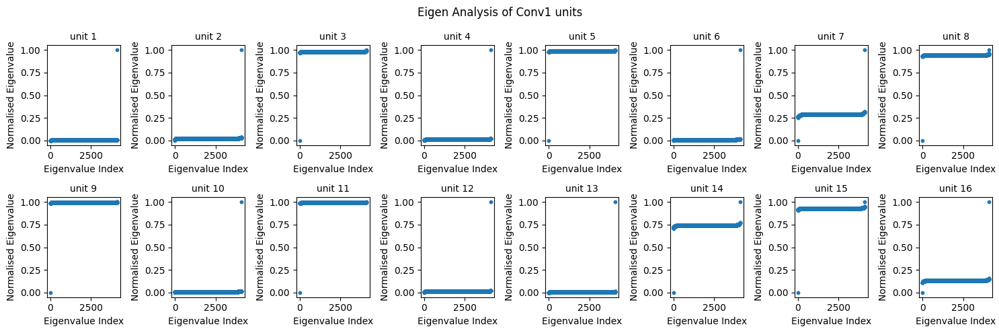

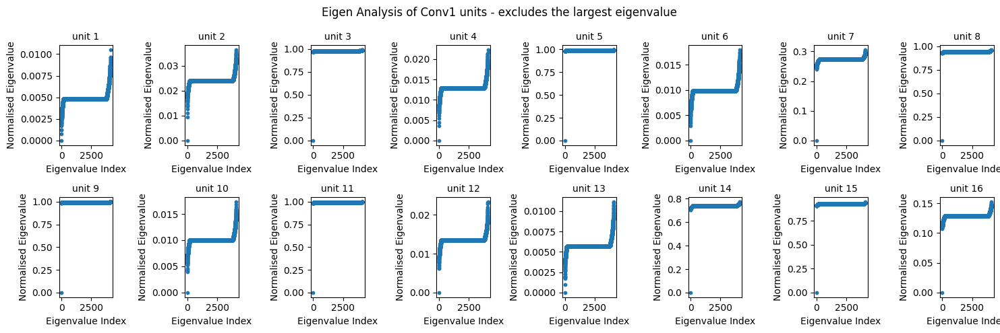

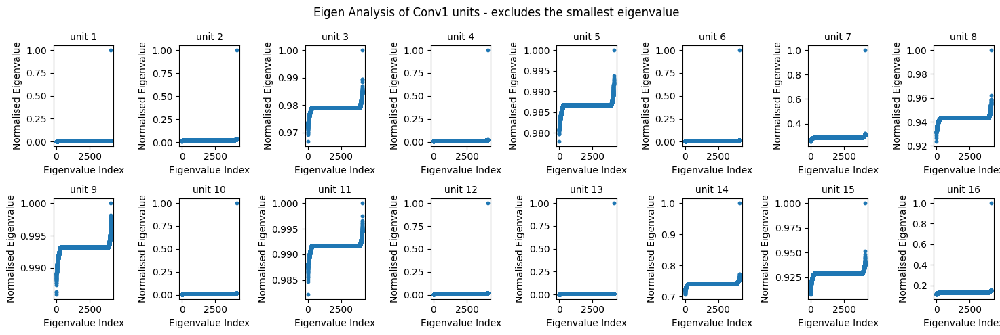

In [50]:
# conv1 eigenvalues
for i in range(len(eigen1)): # each unit
    plt.subplot(2, 8, i+1)
    
    if act_conv1[i][act_conv1[i] != 0].shape[0] != 0: # if list is not empty
        # plot the eigenvalues for red (first) channel only
        eigenvalues = eigen1[i][0].eigenvalues
        eigenvalues = (eigenvalues - eigenvalues.min()) / (eigenvalues.max() - eigenvalues.min()) # normalise to [0, 1]
        plt.scatter(range(len(eigenvalues)), eigenvalues, s=10)
        plt.title('unit ' + str(i+1), fontsize=10)
        plt.xlabel('Eigenvalue Index')
        plt.ylabel('Normalised Eigenvalue')
        # change figure size
        plt.gcf().set_size_inches(13, 5)
    else:
        # plot shows text saying 'inactive'
        plt.text(0.5, 0.5, 'inactive', horizontalalignment='center', verticalalignment='center')
        # turn off axis
        plt.title('unit ' + str(i+1), fontsize=10)
        plt.axis('off')
plt.suptitle('Eigen Analysis of Conv1 units')
plt.tight_layout()
# change figure size
plt.gcf().set_size_inches(15, 5)
plt.show()

plt.figure()
for i in range(len(eigen1)): # each unit
    plt.subplot(2, 8, i+1)
    
    if act_conv1[i][act_conv1[i] != 0].shape[0] != 0: # if list is not empty
        # plot the eigenvalues for red (first) channel only
        eigenvalues = eigen1[i][1].eigenvalues
        eigenvalues = (eigenvalues - eigenvalues.min()) / (eigenvalues.max() - eigenvalues.min()) # normalise to [0, 1]
        plt.scatter(range(len(eigenvalues)-1), eigenvalues[:-1], s=10)
        plt.title('unit ' + str(i+1), fontsize=10)
        plt.xlabel('Eigenvalue Index')
        plt.ylabel('Normalised Eigenvalue')
        # change figure size
        plt.gcf().set_size_inches(13, 5)
    else:
        # plot shows text saying 'inactive'
        plt.text(0.5, 0.5, 'inactive', horizontalalignment='center', verticalalignment='center')
        # turn off axis
        plt.title('unit ' + str(i+1), fontsize=10)
        plt.axis('off')
plt.suptitle('Eigen Analysis of Conv1 units - excludes the largest eigenvalue')
plt.tight_layout()
# change figure size
plt.gcf().set_size_inches(15, 5)

plt.figure()
for i in range(len(eigen1)): # each unit
    plt.subplot(2, 8, i+1)
    
    if act_conv1[i][act_conv1[i] != 0].shape[0] != 0: # if list is not empty
        # plot the eigenvalues for red (first) channel only
        eigenvalues = eigen1[i][0].eigenvalues
        eigenvalues = (eigenvalues - eigenvalues.min()) / (eigenvalues.max() - eigenvalues.min()) # normalise to [0, 1]
        plt.scatter(range(len(eigenvalues)-1), eigenvalues[1:], s=10)
        plt.title('unit ' + str(i+1), fontsize=10)
        plt.xlabel('Eigenvalue Index')
        plt.ylabel('Normalised Eigenvalue')
        # change figure size
        plt.gcf().set_size_inches(13, 5)
    else:
        # plot shows text saying 'inactive'
        plt.text(0.5, 0.5, 'inactive', horizontalalignment='center', verticalalignment='center')
        # turn off axis
        plt.title('unit ' + str(i+1), fontsize=10)
        plt.axis('off')
plt.suptitle('Eigen Analysis of Conv1 units - excludes the smallest eigenvalue')
plt.tight_layout()
# change figure size
plt.gcf().set_size_inches(15, 5)

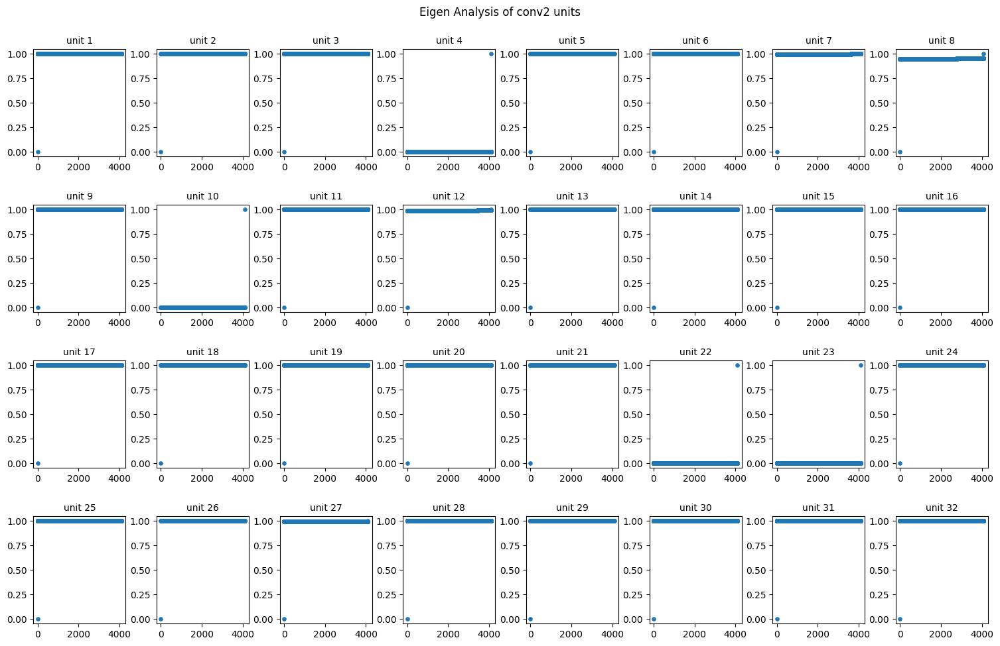

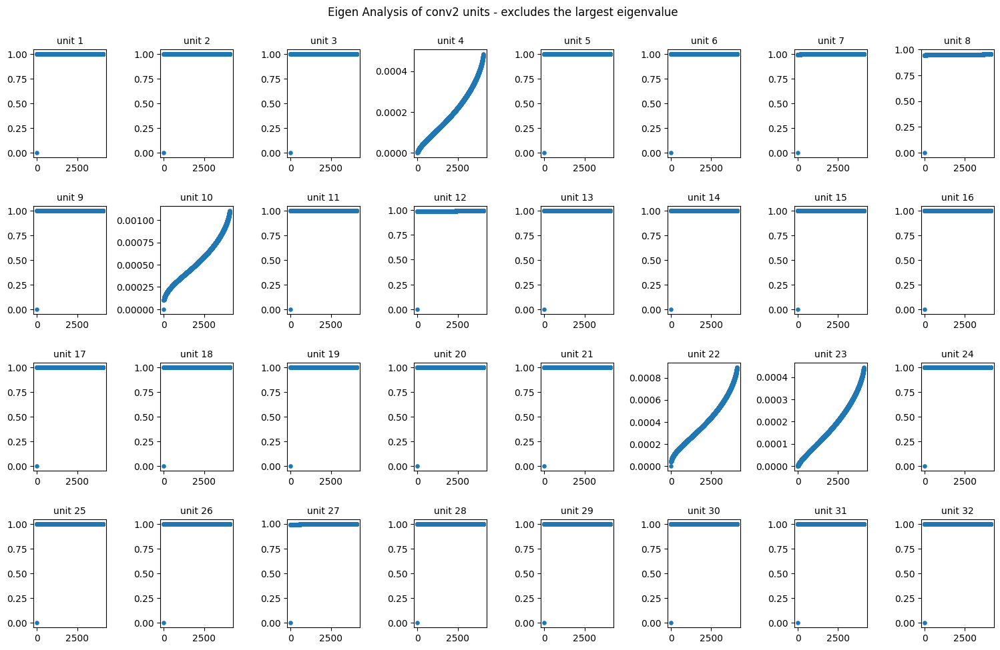

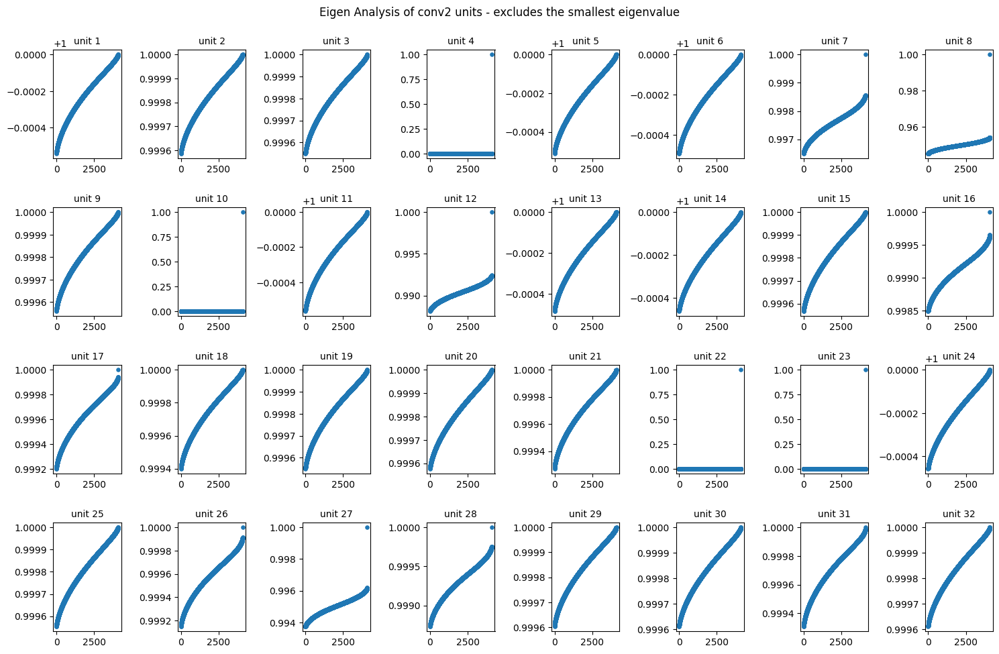

In [343]:
# conv2 eigenvalues
for i in range(len(eigen2)): # each unit
    plt.subplot(4, 8, i+1)
    temp = act_conv2[i][act_conv2[i] != 0]
    if temp.shape[0] != 0:
        # plot the eigenvalues for red (first) channel only
        eigenvalues = eigen2[i][0].eigenvalues # channel selection
        eigenvalues = (eigenvalues - eigenvalues.min()) / (eigenvalues.max() - eigenvalues.min())
        plt.scatter(range(len(eigenvalues)), eigenvalues, s=14)
        plt.title('unit ' + str(i+1), fontsize=10)
        # change figure size
        plt.gcf().set_size_inches(15, 8)
    else:
        # plot shows text saying 'inactive'
        plt.text(0.5, 0.5, 'inactive', horizontalalignment='center', verticalalignment='center')
        # turn off axis
        plt.title('unit ' + str(i+1), fontsize=10)
        plt.axis('off')
plt.suptitle('Eigen Analysis of conv2 units')
plt.tight_layout()
# change figure size
plt.gcf().set_size_inches(15, 10)
plt.show()

plt.figure()
for i in range(len(eigen2)): # each unit
    plt.subplot(4, 8, i+1)
    temp = act_conv2[i][act_conv2[i] != 0]
    if temp.shape[0] != 0:
        # plot the eigenvalues for red (first) channel only
        eigenvalues = eigen2[i][0].eigenvalues # channel selection
        eigenvalues = (eigenvalues - eigenvalues.min()) / (eigenvalues.max() - eigenvalues.min())
        plt.scatter(range(len(eigenvalues)-1), eigenvalues[:-1], s=14)
        plt.title('unit ' + str(i+1), fontsize=10)
        # change figure size
        plt.gcf().set_size_inches(15, 8)
    else:
        # plot shows text saying 'inactive'
        plt.text(0.5, 0.5, 'inactive', horizontalalignment='center', verticalalignment='center')
        # turn off axis
        plt.title('unit ' + str(i+1), fontsize=10)
        plt.axis('off')
plt.suptitle('Eigen Analysis of conv2 units - excludes the largest eigenvalue')
plt.tight_layout()
# change figure size
plt.gcf().set_size_inches(15, 10)
plt.show()

plt.figure()
for i in range(len(eigen2)): # each unit
    plt.subplot(4, 8, i+1)
    temp = act_conv2[i][act_conv2[i] != 0]
    if temp.shape[0] != 0:
        # plot the eigenvalues for red (first) channel only
        eigenvalues = eigen2[i][0].eigenvalues # channel selection
        eigenvalues = (eigenvalues - eigenvalues.min()) / (eigenvalues.max() - eigenvalues.min())
        plt.scatter(range(len(eigenvalues)-1), eigenvalues[1:], s=14)
        plt.title('unit ' + str(i+1), fontsize=10)
        # change figure size
        plt.gcf().set_size_inches(15, 8)
    else:
        # plot shows text saying 'inactive'
        plt.text(0.5, 0.5, 'inactive', horizontalalignment='center', verticalalignment='center')
        # turn off axis
        plt.title('unit ' + str(i+1), fontsize=10)
        plt.axis('off')
plt.suptitle('Eigen Analysis of conv2 units - excludes the smallest eigenvalue')
plt.tight_layout()
# change figure size
plt.gcf().set_size_inches(15, 10)
plt.show()

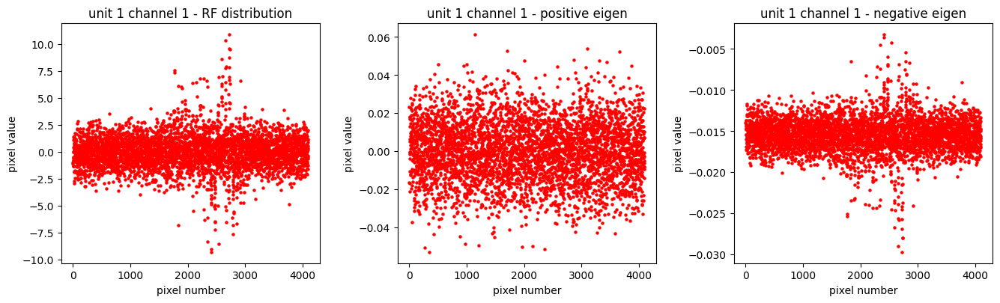

In [345]:
unit = 0
channel = 0
color = ['red', 'green', 'blue']

plt.subplot(1, 3, 1)
x = rf2[unit].reshape(-1, 3)
x = x[:, channel]
# x = (x - x.min()) / (x.max() - x.min())
plt.scatter(range(len(x)), x, s=5, c=color[channel])
plt.title('unit ' + str(unit+1) + ' channel ' + str(channel+1) + ' - RF distribution')
plt.xlabel('pixel number')
plt.ylabel('pixel value')
# set size
# plt.gcf().set_size_inches(5, 5)

plt.subplot(1, 3, 2)
x = eigen2[unit][channel].eigenvectors[:,-1]
# x = (x - x.min()) / (x.max() - x.min())
plt.scatter(range(len(x)), x, s=5, c=color[channel])
plt.title('unit ' + str(unit+1) + ' channel ' + str(channel+1) + ' - positive eigen')
plt.xlabel('pixel number')
plt.ylabel('pixel value')
# plt.gcf().set_size_inches(5, 5)

plt.subplot(1, 3, 3)
x = eigen2[unit][channel].eigenvectors[:,0]
# x = (x - x.min()) / (x.max() - x.min())
plt.scatter(range(len(x)), x, s=5, c=color[channel])
plt.title('unit ' + str(unit+1) + ' channel ' + str(channel+1) + ' - negative eigen')
plt.xlabel('pixel number')
plt.ylabel('pixel value')

plt.tight_layout()
# decrease distance between subplots
plt.subplots_adjust(wspace=0.3)
plt.gcf().set_size_inches(15, 4)
plt.show()

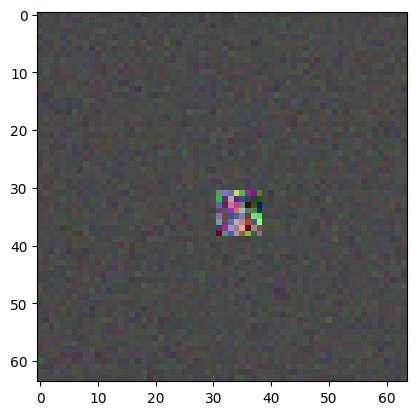

In [1009]:
# individual unit visualisation
i = 4 # unit
j = -1 # eigenvalue (smallest or largest)

to_show = torch.zeros(64, 64, 3)
R = eigen1[i][0].eigenvectors
G = eigen1[i][1].eigenvectors
B = eigen1[i][2].eigenvectors

to_show[:, :, 0] = R[:, j].reshape(64, 64) 
to_show[:, :, 1] = G[:, j].reshape(64, 64) 
to_show[:, :, 2] = B[:, j].reshape(64, 64) * -1

to_show = (to_show - to_show.min()) / (to_show.max() - to_show.min())

plt.imshow(to_show)

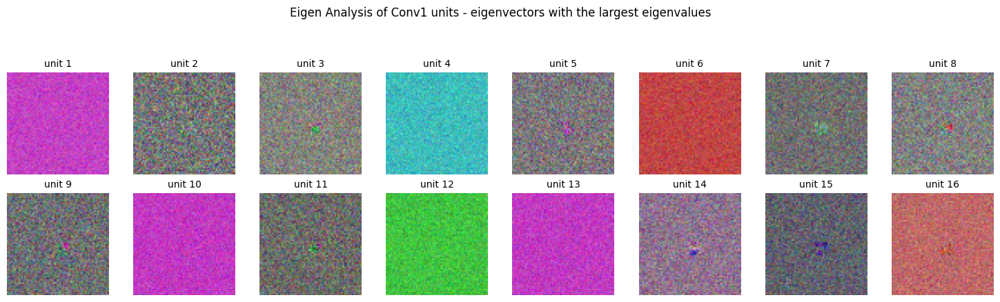

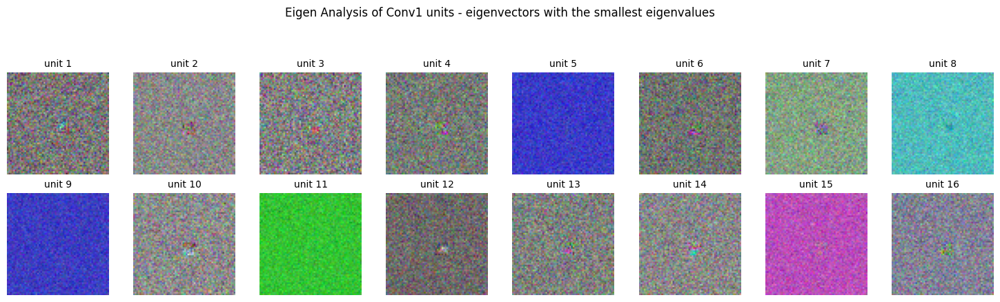

In [51]:
# eigenvectors - conv1 LARGEST
for i in range(len(eigen1)): # each unit
    to_show = torch.zeros(64, 64, 3)
    plt.subplot(2, 8, i+1)
    plt.axis('off')
    if act_conv1[i][act_conv1[i] != 0].shape[0] != 0:
        for j in range(3): # append each channel
            eigenvector = eigen1[i][j].eigenvectors # given channel for a given unit
            # eigenvector = eigenvector * eigen1[i][j].eigenvalues
            to_show[:, :, j] = eigenvector[:, -1].reshape(64, 64) # select the eigenvector with the largest eigenvalue
        to_show = (to_show - to_show.min()) / (to_show.max() - to_show.min())
        plt.imshow(to_show) # normalise to [0, 1]
    else:
        # show a black image
        plt.imshow(np.zeros((64, 64, 3)))
    plt.title('unit ' + str(i+1), fontsize=10)

plt.suptitle('Eigen Analysis of Conv1 units - eigenvectors with the largest eigenvalues') 
plt.tight_layout()
# change figure size
plt.gcf().set_size_inches(15, 5)
plt.show()

# eigenvectors - conv1 SMALLEST
for i in range(len(eigen1)): # each unit
    to_show = torch.zeros(64, 64, 3)
    plt.subplot(2, 8, i+1)
    plt.axis('off')
    if act_conv1[i][act_conv1[i] != 0].shape[0] != 0:
        for j in range(3): # append each channel
            eigenvector = eigen1[i][j].eigenvectors # given channel for a given unit
            # eigenvector = eigenvector * eigen1[i][j].eigenvalues
            to_show[:, :, j] = eigenvector[:, 0].reshape(64, 64) # select the eigenvector with the largest eigenvalue
        to_show = (to_show - to_show.min()) / (to_show.max() - to_show.min())
        plt.imshow(to_show) # normalise to [0, 1]
    else:
        # show a black image
        plt.imshow(np.zeros((64, 64, 3)))
    plt.title('unit ' + str(i+1), fontsize=10)

plt.suptitle('Eigen Analysis of Conv1 units - eigenvectors with the smallest eigenvalues') 
plt.tight_layout()
# change figure size
plt.gcf().set_size_inches(15, 5)
plt.show()


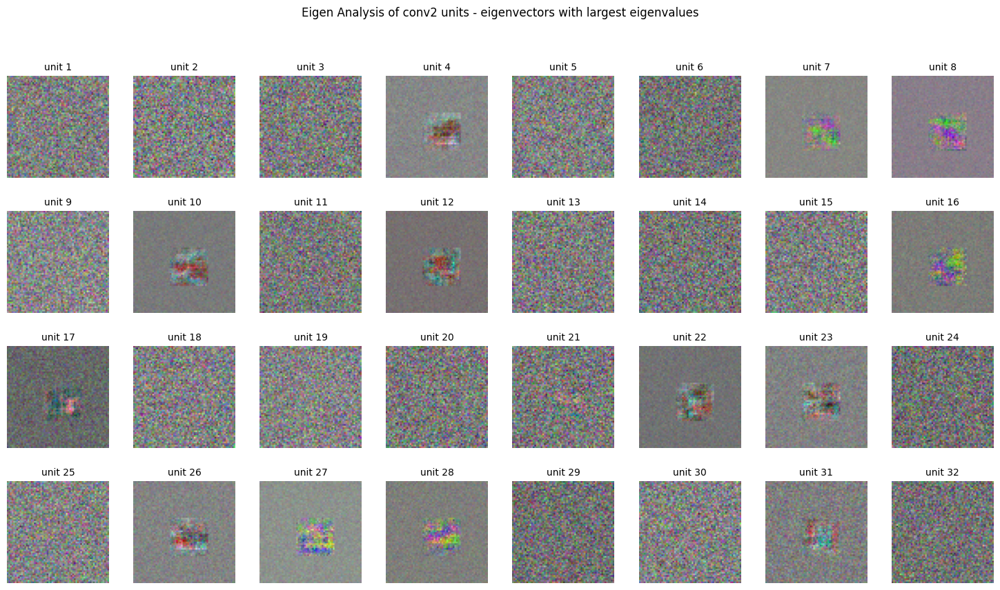

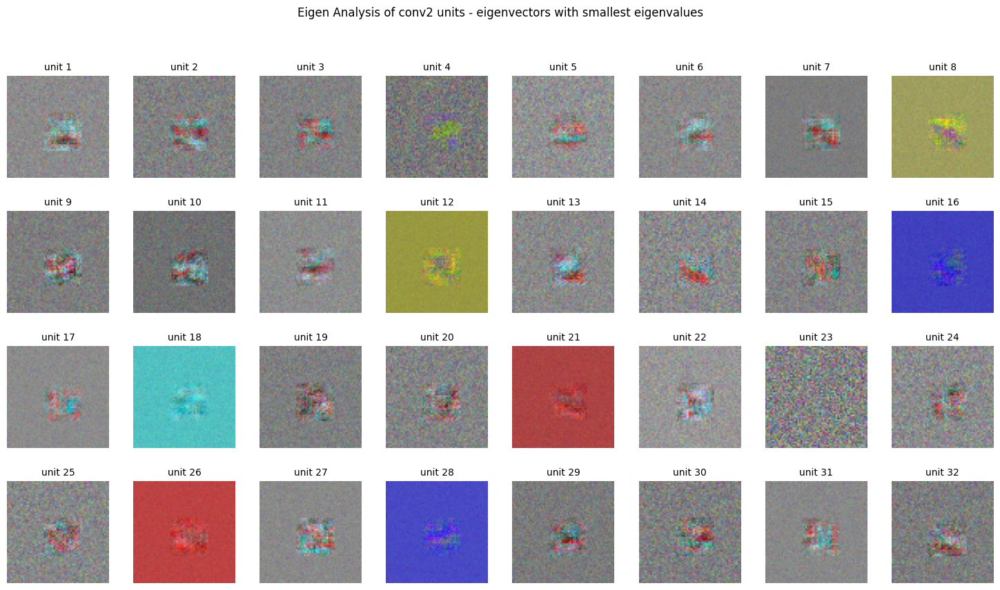

In [347]:
# eigenvectors - conv2
for i in range(len(eigen2)): # each unit
    to_show = torch.zeros(64, 64, 3)
    plt.subplot(4, 8, i+1)
    plt.axis('off')

    if act_conv2[i][act_conv2[i] != 0].shape[0] != 0:
        # plot the eigenvalues for red (first) channel only
        for j in range(3):
            eigenvector = eigen2[i][j].eigenvectors # second term = channel
            to_show[:, :, j] = eigenvector[:, -1].reshape(64, 64) # takes the largest eigenvalue
        to_show = (to_show - to_show.min())/(to_show.max() - to_show.min())
        plt.imshow(to_show) # normalise to [0, 1]
    else:
        # show a black image
        plt.imshow(np.zeros((64, 64, 3)))
    plt.title('unit ' + str(i+1), fontsize=10)

plt.suptitle('Eigen Analysis of conv2 units - eigenvectors with largest eigenvalues') 
plt.tight_layout()
# change figure size
plt.gcf().set_size_inches(15, 9)
plt.show()

plt.figure()
for i in range(len(eigen2)): # each unit
    to_show = torch.zeros(64, 64, 3)
    plt.subplot(4, 8, i+1)
    plt.axis('off')

    if act_conv2[i][act_conv2[i] != 0].shape[0] != 0:
        # plot the eigenvalues for red (first) channel only
        for j in range(3):
            eigenvector = eigen2[i][j].eigenvectors # second term = channel
            to_show[:, :, j] = eigenvector[:, 0].reshape(64, 64) # takes the largest eigenvalue
        to_show = (to_show - to_show.min())/(to_show.max() - to_show.min())
        plt.imshow(to_show) # normalise to [0, 1]
    else:
        # show a black image
        plt.imshow(np.zeros((64, 64, 3)))
    plt.title('unit ' + str(i+1), fontsize=10)

plt.suptitle('Eigen Analysis of conv2 units - eigenvectors with smallest eigenvalues') 
plt.tight_layout()
# change figure size
plt.gcf().set_size_inches(15, 9)
plt.show()

# Phase Weighted Analysis

Conv 1

In [282]:
NUnits = act_conv1.shape[0]
phase_rf1 = torch.zeros((NUnits, 64, 64, 3))

with tqdm(total=NUnits*NBatches*BSize) as pbar:
    for i in range(NUnits):
        count = 0
        mean = act_conv1[i].mean()
        for j in range(NBatches*BSize):
            if act_conv1[i, j] != 0:
                phase_rf1[i] += abs(act_conv1[i, j]) * noise1[j]
                count += 1
            pbar.update(1)
        # divide rf[i] by the number of non-zero values in act_conv[i]
        phase_rf1[i] /= count

100%|██████████| 800000/800000 [02:36<00:00, 5097.46it/s] 


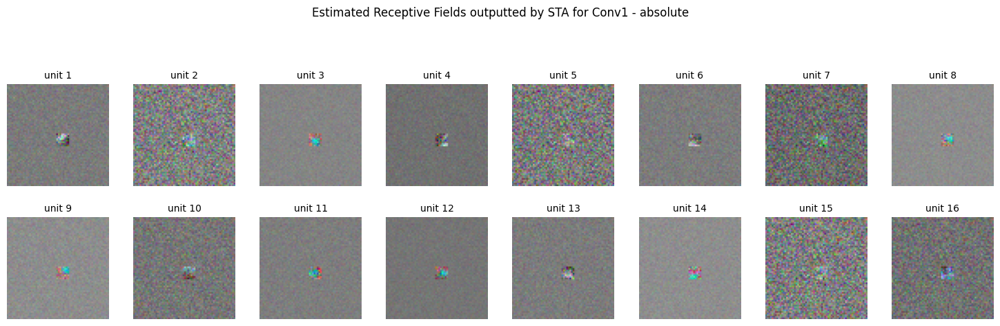

In [283]:
# conv1 RF display for phase weighted average
for i in range(phase_rf1.shape[0]): # loop through each unit
    plt.subplot(2, 8, i+1) # nrows, ncols, index
    plt.axis('off')
    to_show = phase_rf1[i]
    if to_show.any() != 0:
        to_show = (to_show - to_show.min()) / (to_show.max() - to_show.min()) # normalise to [0, 1]
        plt.imshow(to_show)
    else:
        # show a black image
        plt.imshow(np.zeros((64, 64, 3)))
    plt.title('unit ' + str(i+1), fontsize=10)

# title for the entire plot
plt.suptitle('Estimated Receptive Fields outputted by STA for Conv1 - absolute')
# increase the spacing between subplots
plt.tight_layout()
# change figure size
plt.gcf().set_size_inches(15, 5.5)
plt.show()

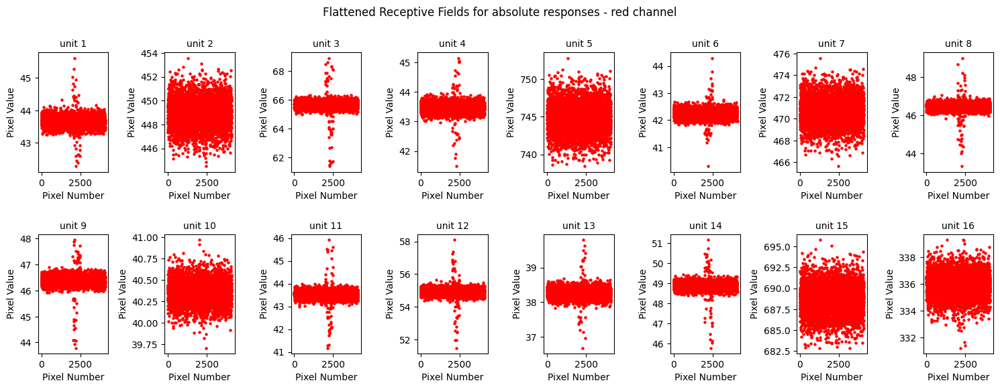

In [286]:
channel = 0
color = ['red', 'green', 'blue']

for i in range(phase_rf1.shape[0]): # loop through each unit
    plt.subplot(2, 8, i+1) # nrows, ncols, index
    plt.xlabel('Pixel Number')
    plt.ylabel('Pixel Value')
    to_show = phase_rf1[i,:,:,channel]
    if to_show.any() != 0:
        # flatten the receptive field into 1 x 4096
        to_show = to_show.flatten()
        plt.scatter(range(len(to_show)), to_show, s=5, c=color[channel])
        plt.gcf().set_size_inches(15, 5)
    else:
        # show a black image
        plt.imshow(np.zeros((64, 64, 3)))
    plt.title('unit ' + str(i+1), fontsize=10)

# title for the entire plot
plt.suptitle(f'Flattened Receptive Fields for absolute responses - {color[channel]} channel')
# increase the spacing between subplots
plt.tight_layout()
# change figure size
plt.gcf().set_size_inches(15, 6)
plt.show()

Normalised Noise

In [339]:
NUnits = act_conv1.shape[0]
norm_rf1 = torch.zeros((NUnits, 64, 64, 3))
flat_noise = noise1.reshape(noise1.shape[0], -1, 3)

with tqdm(total=NUnits*NBatches*BSize) as pbar:
    for i in range(NUnits):
        count = 0
        mean = act_conv1[i].mean()
        for j in range(NBatches*BSize):
            noise_norm2_R = math.sqrt((flat_noise[j, :, 0]).T @ (flat_noise[j, :, 0]))
            noise_norm2_G = math.sqrt((flat_noise[j, :, 1]).T @ (flat_noise[j, :, 1]))
            noise_norm2_B = math.sqrt((flat_noise[j, :, 2]).T @ (flat_noise[j, :, 2]))
            if act_conv1[i, j] > 1.5:
                norm_rf1[i,:,:,0] += act_conv1[i, j] * noise1[j,:,:,0] / noise_norm2_R
                norm_rf1[i,:,:,1] += act_conv1[i, j] * noise1[j,:,:,1] / noise_norm2_G
                norm_rf1[i,:,:,2] += act_conv1[i, j] * noise1[j,:,:,2] / noise_norm2_B
                count += 1
            pbar.update(1)
        # divide rf[i] by the number of non-zero values in act_conv[i]
        norm_rf1[i] /= count

100%|██████████| 800000/800000 [02:07<00:00, 6261.68it/s]


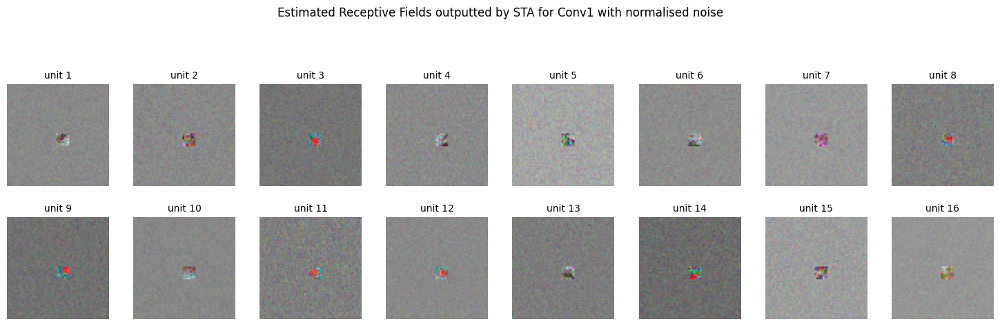

In [340]:
# conv1 RF
for i in range(norm_rf1.shape[0]): # loop through each unit
    plt.subplot(2, 8, i+1) # nrows, ncols, index
    plt.axis('off')
    to_show = norm_rf1[i]
    if to_show.any() != 0:
        to_show = (to_show - to_show.min()) / (to_show.max() - to_show.min()) # normalise to [0, 1]
        plt.imshow(to_show)
    else:
        # show a black image
        plt.imshow(np.zeros((64, 64, 3)))
    plt.title('unit ' + str(i+1), fontsize=10)

# title for the entire plot
plt.suptitle('Estimated Receptive Fields outputted by STA for Conv1 with normalised noise')
# increase the spacing between subplots
plt.tight_layout()
# change figure size
plt.gcf().set_size_inches(15, 5.5)
plt.show()

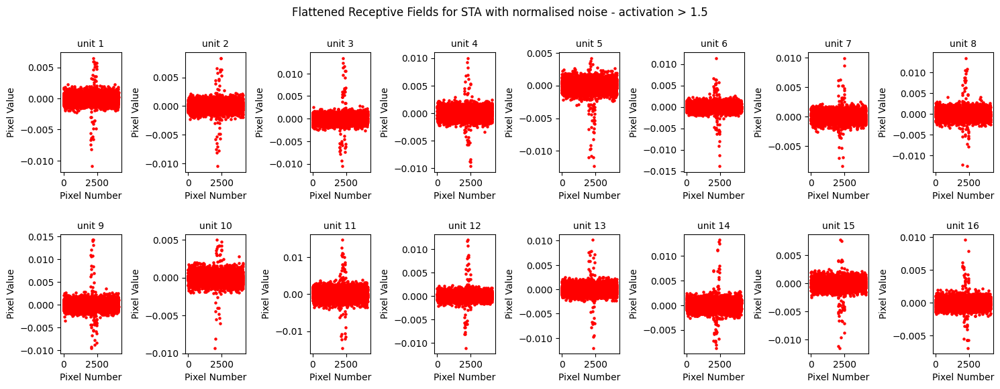

In [341]:
channel = 0
color = ['red', 'green', 'blue']

for i in range(norm_rf1.shape[0]): # loop through each unit
    plt.subplot(2, 8, i+1) # nrows, ncols, index
    plt.xlabel('Pixel Number')
    plt.ylabel('Pixel Value')
    to_show = norm_rf1[i,:,:,channel]
    if to_show.any() != 0:
        # flatten the receptive field into 1 x 4096
        to_show = to_show.flatten()
        plt.scatter(range(len(to_show)), to_show, s=5, c=color[channel])
        plt.gcf().set_size_inches(15, 5)
    else:
        # show a black image
        plt.imshow(np.zeros((64, 64, 3)))
    plt.title('unit ' + str(i+1), fontsize=10)

# title for the entire plot
plt.suptitle(f'Flattened Receptive Fields for STA with normalised noise - activation > 1.5')
# increase the spacing between subplots
plt.tight_layout()
# change figure size
plt.gcf().set_size_inches(15, 6)
plt.show()

# Graphical Rrepresentation

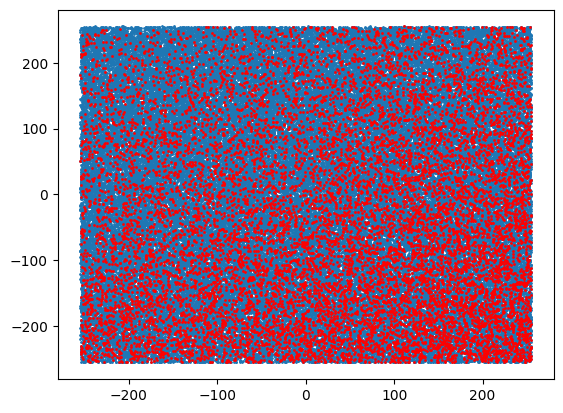

In [756]:
unit = 0
channel = 0

# find the location of the largest & smallest pixel value in rf1[unit] for a given channel
r_max, c_max = np.unravel_index(np.argmax(rf1[unit,:,:,channel]), rf1[unit,:,:,channel].shape)
r_min, c_min = np.unravel_index(np.argmin(rf1[unit,:,:,channel]), rf1[unit,:,:,channel].shape)

x = []
y = []
for i in range(noise1.shape[0]):
    x.append(noise1[i, r_max, c_max, channel])
    y.append(noise1[i, r_min, c_min, channel])
plt.scatter(x, y, s=1)

a = []
b = []
for i in range(noise1.shape[0]):
    if (act_conv1[unit, i]) > 1:
        a.append(noise1[i, r_max, c_max, channel])
        b.append(noise1[i, r_min, c_min, channel])
plt.scatter(a, b, s=1, c='red')